In [1]:
import numpy as np
from scipy.signal import butter, lfilter
from sklearn.model_selection  import train_test_split
import pickle
from tqdm import tqdm
import gc

In [2]:
FS = 1000
cutoff = 10 #Hz

In [3]:
def low_pass_filter(fs=FS, cutoff=30, order=7): # parameter impacts on the performace
    b, a = butter(order, 0.5* cutoff / fs, btype='low', analog=False)
    return (b,a)

In [4]:
def butter_lowpass(cutoff=5, fs=FS, order=5):
    nyq = 0.5 * fs
    normal_cutoff = cutoff / nyq
    b, a = butter(order, normal_cutoff, btype='low', analog=False)
    return b, a

def butter_lowpass_filter(data, cutoff=5, fs=FS, order=5):
    b, a = butter_lowpass(cutoff, fs, order=order)
    y = lfilter(b, a, data)
    return y
low_pass_filter = butter_lowpass

In [6]:
path  =  "meeting_processed/loc{}/{}.npy"
# need to use low pass filter  before feed  them into NN

In [7]:
def merge2pickle(path):
    data = {}
    for i in tqdm(range(1,17)):
        # ignore 5 here !!!!!!!!!!!!!!!!!!!!!
#         if i==5: continue
        xpath = path.format(i, 'X')
        ypath = path.format(i, 'y')
        X  =  np.load(xpath)
        y  =  np.load(ypath)
        assert(X.shape[0] == y.shape[0])
        data['X{}'.format(i)] = X
        data['y{}'.format(i)] = y
    #with open('entireData.pkl', 'wb') as f:
        #pickle.dump(data, f)
    print("done")
    return data
    

In [8]:
data = merge2pickle(path)

100%|██████████| 16/16 [00:13<00:00,  1.39s/it]

done


In [9]:
def apply_low_pass_filter(pickle_path):
    #with open(pickle_path,  'rb') as f:
    #    data = pickle.load(f)
    data = pickle_path
    lpf = low_pass_filter(fs=FS, cutoff=cutoff)
    for key in tqdm(list(data.keys())):
        #print(key)
        if key.startswith('X'):
            x = data[key]
            for channel  in range(x.shape[-1]):
                for sample in range(x.shape[0]):
                    tmp  = x[sample, :, channel]
                    #edited
                    tmp = lfilter(lpf[0],lpf[1], tmp)
                    x[sample, :, channel]= tmp
            data[key] = x
    print('done applying lpf')
    print('downsampling, start merge , shuffle and split')
    xs = []
    ys = []
    for i in tqdm(range(1, 17)):
        xs.append(data['X{}'.format(i)][:,1000:3000:10,:])
        del(data['X{}'.format(i)])
        ys.append(data['y{}'.format(i)])
        del(data['y{}'.format(i)])
        gc.collect()
    del(data)
    gc.collect()
    xs = np.concatenate(xs, axis=0)
    ys = np.concatenate(ys, axis=0)
    
    print('train-test splitting...')
    result = train_test_split(xs, ys, test_size=0.2, random_state=7)
    del(xs)
    del(ys)
    gc.collect()
    return result

    

In [10]:
X_train, X_test, y_train, y_test = apply_low_pass_filter(data)

 50%|█████     | 8/16 [00:00<00:00, 78.08it/s]

done applying lpf
downsampling, start merge , shuffle and split


100%|██████████| 16/16 [00:00<00:00, 78.19it/s]


train-test splitting...


In [11]:
print(X_train.shape, y_train.shape)

(2360, 200, 90) (2360, 3)


In [12]:
import matplotlib.pyplot as plt
%matplotlib inline

  0%|          | 0/15 [00:00<?, ?it/s]

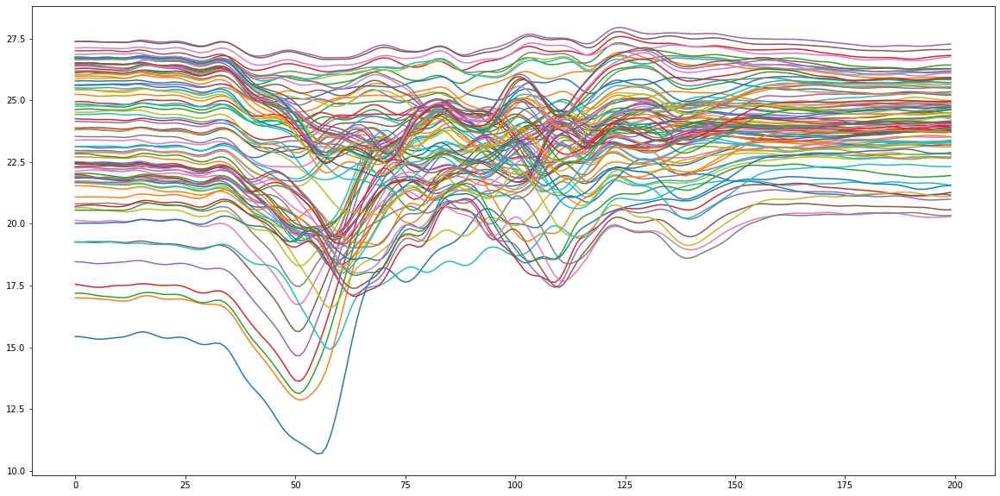

  7%|▋         | 1/15 [00:00<00:05,  2.65it/s]

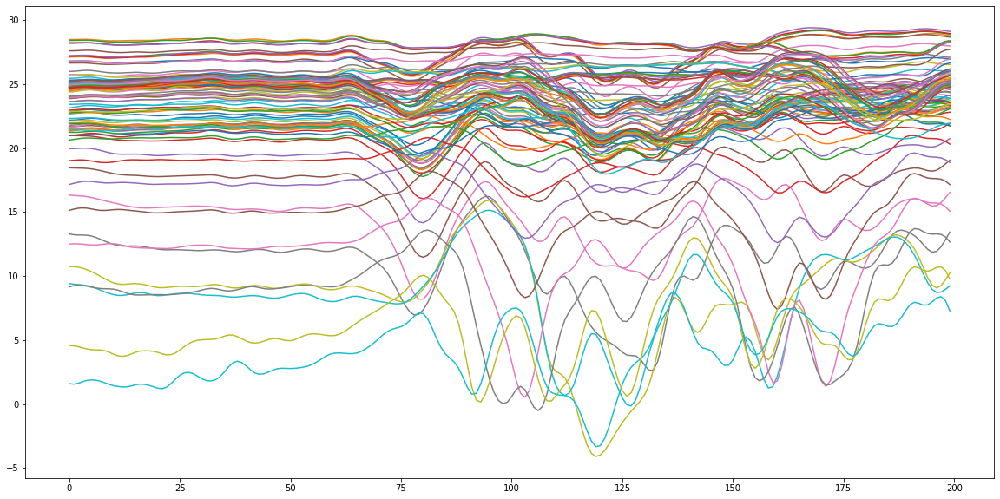

 13%|█▎        | 2/15 [00:00<00:04,  2.77it/s]

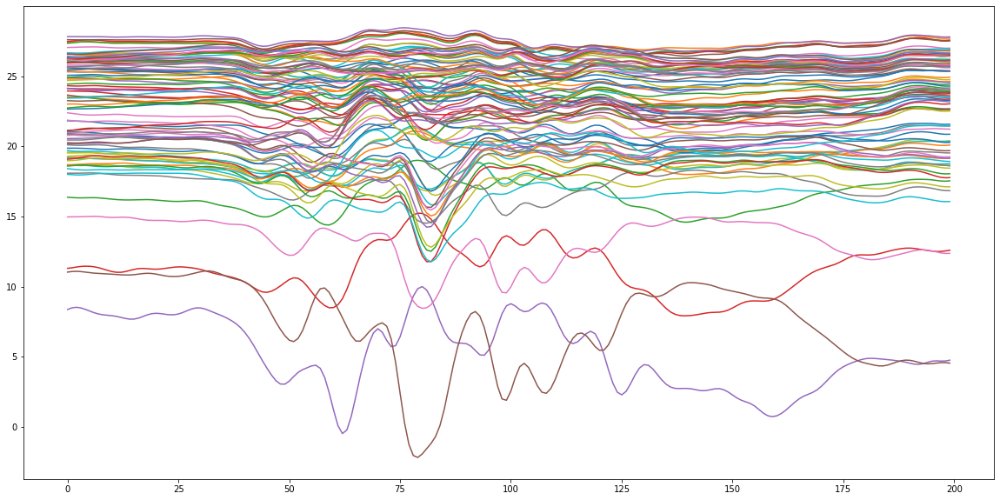

 20%|██        | 3/15 [00:00<00:04,  2.98it/s]

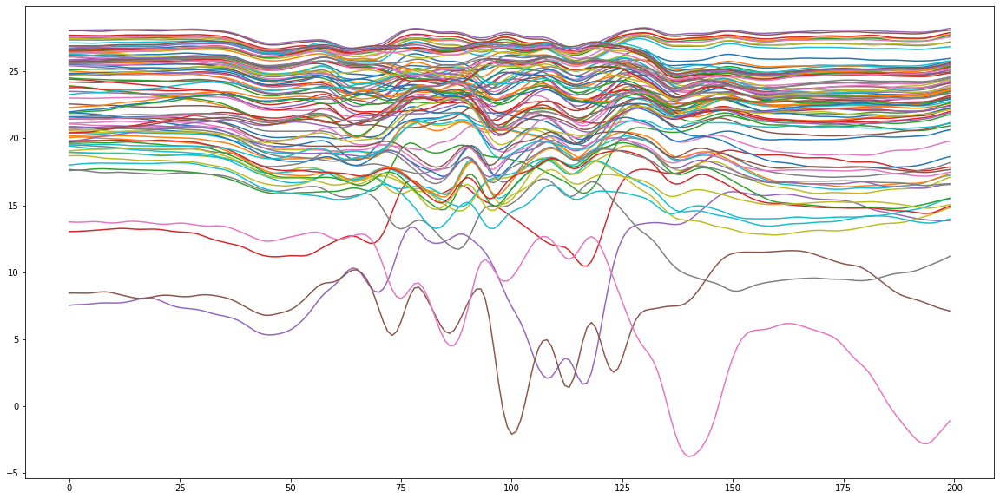

 27%|██▋       | 4/15 [00:01<00:03,  3.09it/s]

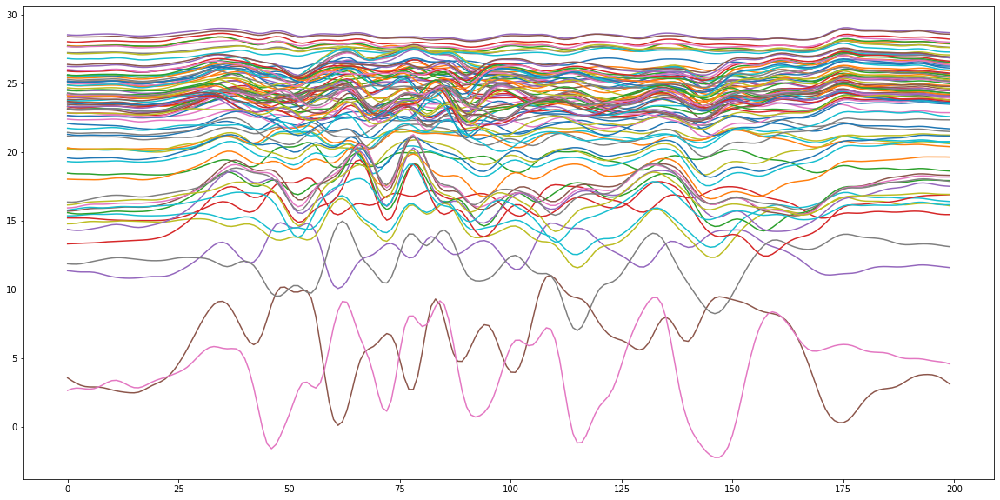

 33%|███▎      | 5/15 [00:01<00:03,  3.18it/s]

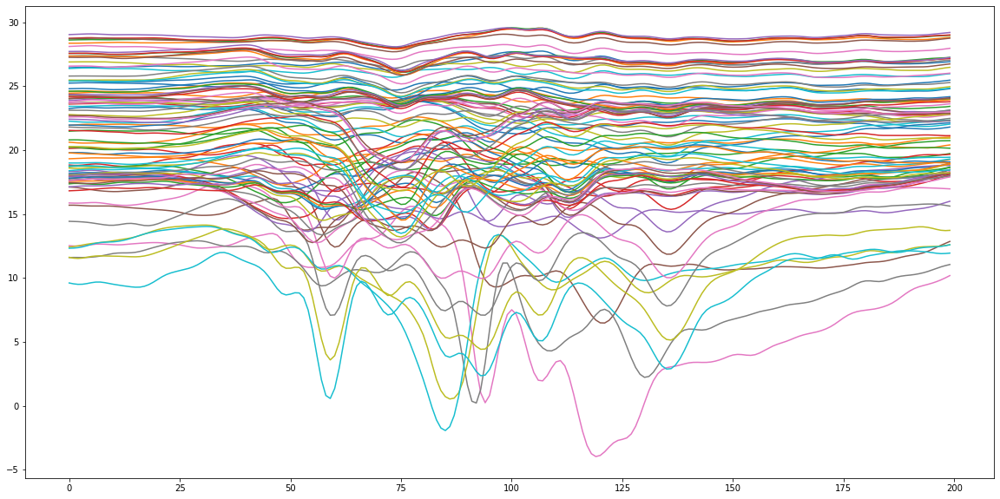

 40%|████      | 6/15 [00:01<00:02,  3.26it/s]

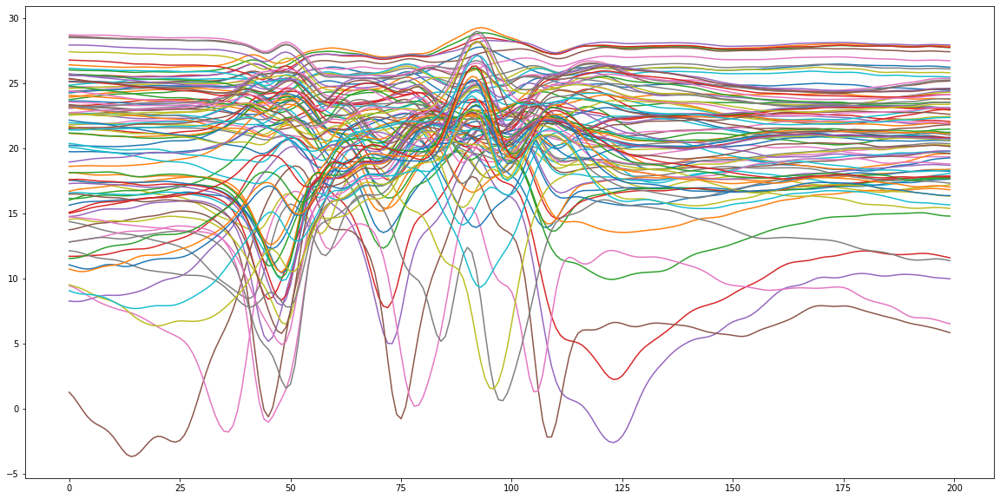

 47%|████▋     | 7/15 [00:02<00:02,  3.25it/s]

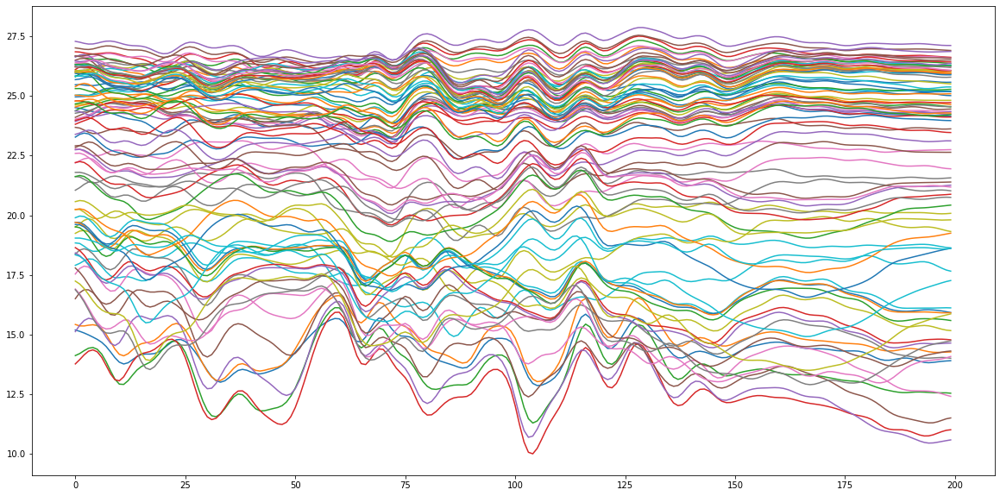

 53%|█████▎    | 8/15 [00:02<00:02,  3.14it/s]

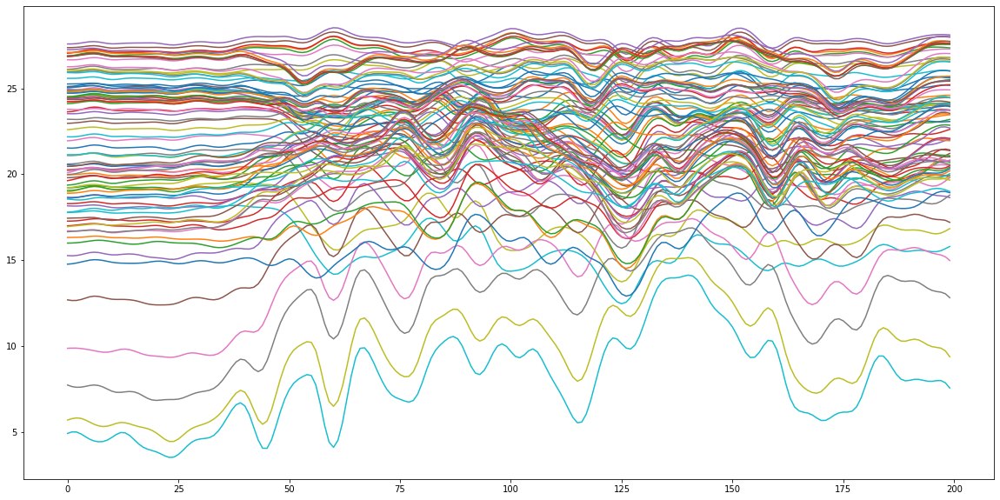

 60%|██████    | 9/15 [00:02<00:01,  3.21it/s]

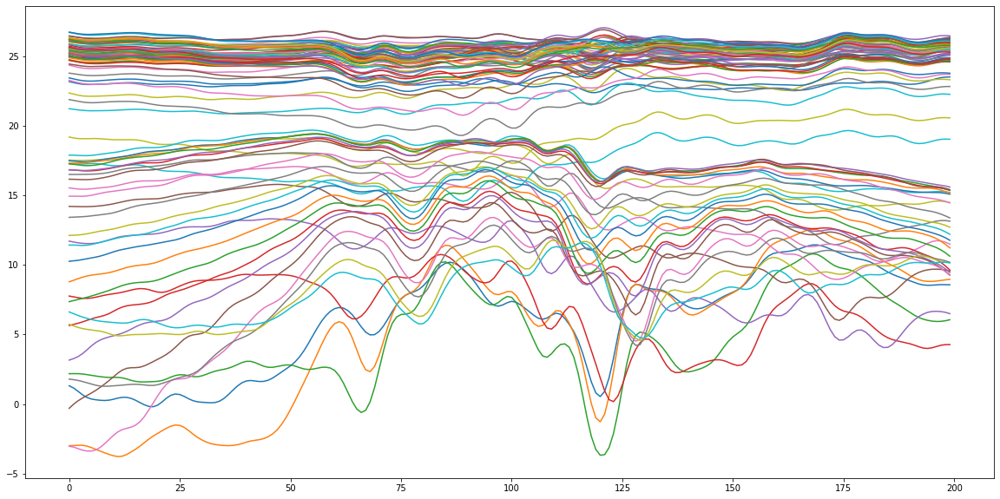

 67%|██████▋   | 10/15 [00:03<00:01,  3.31it/s]

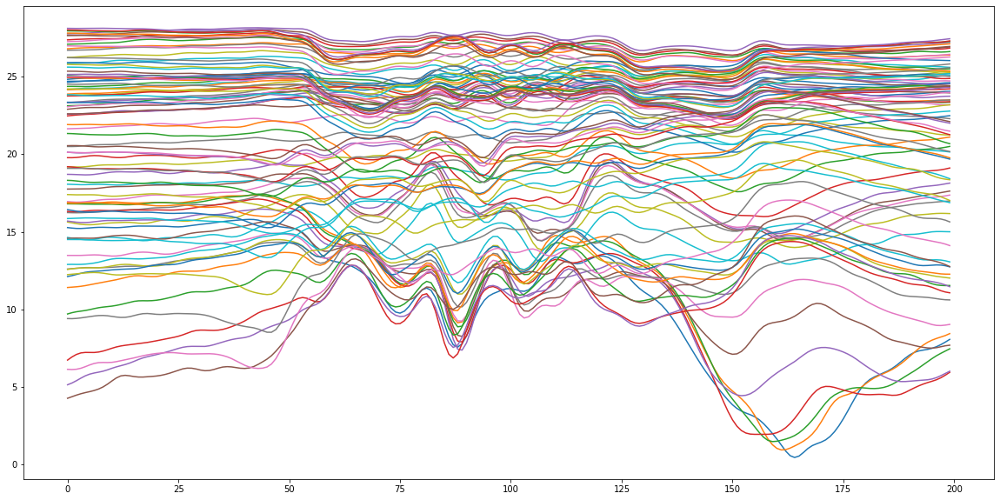

 73%|███████▎  | 11/15 [00:03<00:01,  3.36it/s]

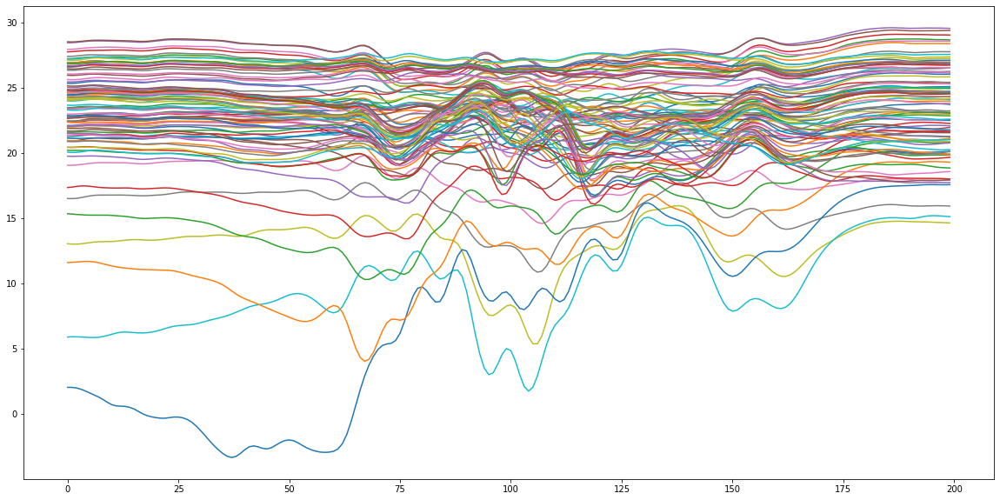

 80%|████████  | 12/15 [00:03<00:00,  3.41it/s]

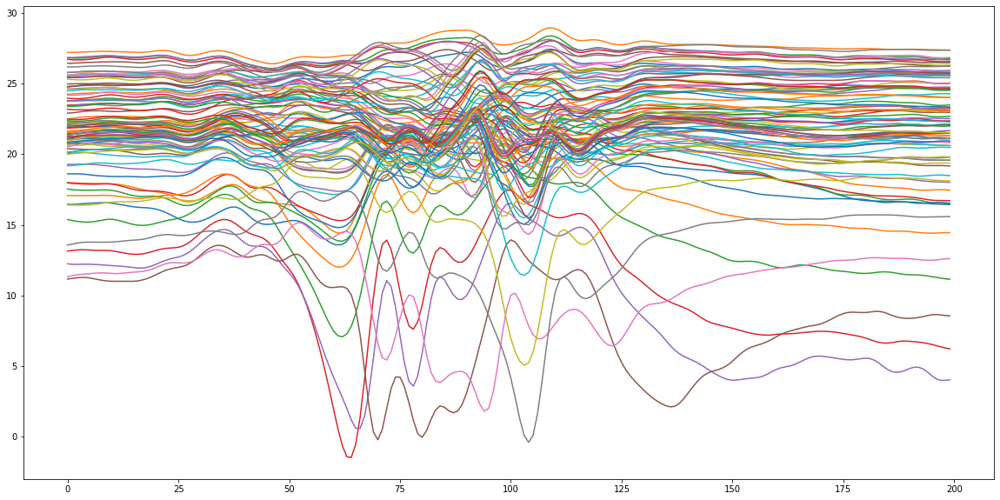

 87%|████████▋ | 13/15 [00:03<00:00,  3.26it/s]

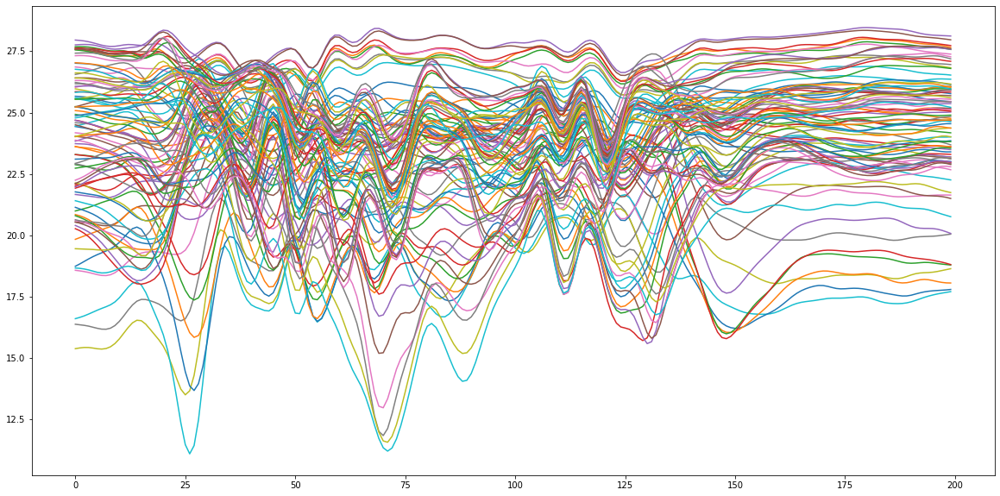

 93%|█████████▎| 14/15 [00:04<00:00,  3.12it/s]

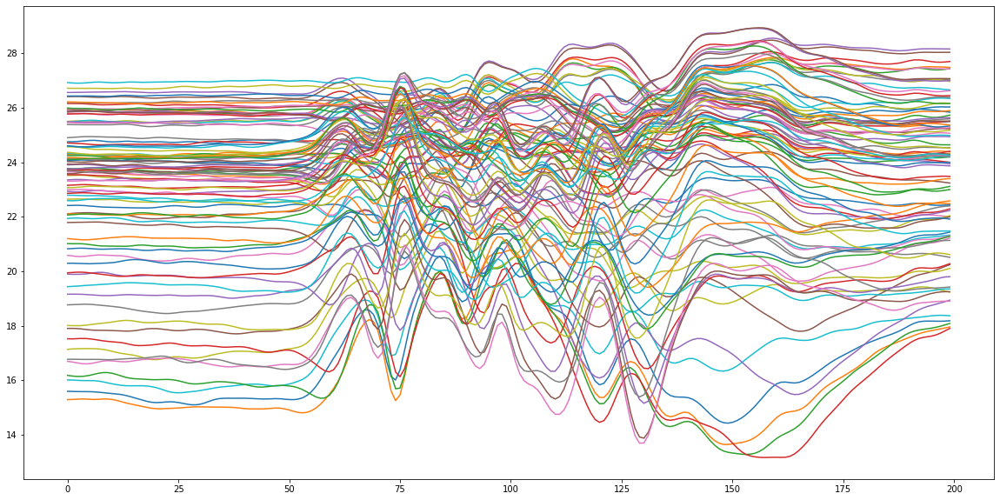

100%|██████████| 15/15 [00:04<00:00,  3.07it/s]


In [13]:
for i in tqdm(range(15)):
    sample = X_train[i]
    plt.figure(figsize=(20,10))
    plt.plot(sample[:])
    plt.show()

In [14]:
np.save('X_train.npy', X_train)

In [15]:
np.save('y_train.npy', y_train)

In [16]:
np.save('X_test.npy', X_test)

In [17]:
np.save('y_test.npy' ,y_test)

In [18]:
print(X_train.shape, y_train.shape)

(2360, 200, 90) (2360, 3)


In [19]:
print(X_test.shape, y_test.shape)

(590, 200, 90) (590, 3)
